<a href="https://colab.research.google.com/github/RandDahmash/Mining-project/blob/main/Phase3Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1- Problem Statement

The problem addressed in this project is predicting students’ adaptability levels in online learning environments. As online education becomes more common, identifying which students struggle and which adapt well is critical for improving learning quality. This project aims to classify students into Low, Moderate, and High adaptability levels and understand which features influence adaptability. Solving this problem helps educators provide better support and allows institutions to design more effective digital learning systems.

# 2-Data Mining Task

The problem is formalized as a data mining task involving both classification and clustering.

**1. Classification Task**

The goal of the classification task is to predict the student’s Adaptivity Level in online education (Low, Moderate, High)
This helps determine which factors influence adaptability and allows us to automatically classify new students into the appropriate adaptability category.

**2. Clustering Task**

The clustering task aims to group students into natural clusters based on similarities in their learning conditions, environment, and behavior.
This is useful for discovering hidden patterns, identifying groups of students with similar adaptability characteristics, and assisting educators in designing targeted support strategies.

**Overall Task Definition**
By combining classification (supervised learning) and clustering (unsupervised learning), the project seeks to both predict adaptability levels and explore underlying patterns in student behavior supporting a deeper understanding of student needs in online learning environments.

# 3-Data

#Project Goal:
The project's main goal is a classification and clustring task. We will build a machine learning model to predict a student's adaptability level in an online education environment. This will help identify the factors that influence whether a student will have a low, moderate, or high level of adaptability. The ultimate aim is to use these insights to help educational institutions and policymakers improve online learning resources and support systems.



# Data Source Link :
https://www.kaggle.com/datasets/mdmahmudulhasansuzan/students-adaptability-level-in-online-education

Data is from Kaggle


## Dataset Description

1205 records, 14 attributes

Mix of categorical and numerical features(mostly categorical)



Target variable = Adaptivity Level

**Class Label Description:**

Low: Struggle with online learning

Moderate: Adapt fairly well

High: Very comfortable online learners



In [82]:
import pandas as pd
data=pd.read_csv('Raw_dataset.csv')



target="Adaptivity Level"
all_columns = list(data.columns)
feature_columns = [c for c in all_columns if c !=target]


print("Feature columns in the database:")
print(feature_columns)
print("\nData types of features:")
print(data[feature_columns].dtypes)



print("Number of columns [excluding class]=",len(feature_columns))
print("The class attribute is : ",target)
print("Number of columns [including class]=",len(all_columns))




numOfRecords = len(data)
print("Number of records:", numOfRecords)



print("Class attribute is ",target)
print("Counts/label:")
print(data[target].value_counts().to_frame())


print("Sample of the database")
print(data.head(5))


Feature columns in the database:
['Gender', 'Age', 'Education Level', 'Institution Type', 'IT Student', 'Location', 'Load-shedding', 'Financial Condition', 'Internet Type', 'Network Type', 'Class Duration', 'Self Lms', 'Device']

Data types of features:
Gender                 object
Age                    object
Education Level        object
Institution Type       object
IT Student             object
Location               object
Load-shedding          object
Financial Condition    object
Internet Type          object
Network Type           object
Class Duration         object
Self Lms               object
Device                 object
dtype: object
Number of columns [excluding class]= 13
The class attribute is :  Adaptivity Level
Number of columns [including class]= 14
Number of records: 1205
Class attribute is  Adaptivity Level
Counts/label:
                  count
Adaptivity Level       
Moderate            625
Low                 480
High                100
Sample of the database
 

In [83]:
print("label /Counts:")
for c in all_columns:
  print(data[c].value_counts().to_frame())

label /Counts:
        count
Gender       
Boy       663
Girl      542
        count
Age          
21-25     374
15-Nov    353
16-20     278
5-Jan      81
26-30      68
10-Jun     51
                 count
Education Level       
School             530
University         456
College            219
                  count
Institution Type       
Non Government      823
Government          382
            count
IT Student       
No            901
Yes           304
          count
Location       
Yes         935
No          270
               count
Load-shedding       
Low             1004
High             201
                     count
Financial Condition       
Mid                    878
Poor                   242
Rich                    85
               count
Internet Type       
Mobile Data      695
Wifi             510
              count
Network Type       
4G              775
3G              411
2G               19
                count
Class Duration       
3-Jan             840
6

# Class label

The target variable in this project is Adaptivity Level, which categorizes students into three classes based on how well they adapt to online learning:

Low – Students who struggle with online learning due to limited technology access, learning style mismatch, distractions, or weak online engagement.

Moderate – Students who adapt fairly well but may still face occasional challenges or require additional support.

High – Students who adapt extremely well, showing strong engagement, comfort with digital tools, and effective learning strategies in online environments.

Based on the dataset distribution:

Moderate: 51.9%

Low: 39.8%

High: 8.3%

This distribution shows that the class label is not balanced.

Most students fall into the Moderate and Low categories, while the High class is significantly smaller. This imbalance may affect model performance and should be considered during evaluation.



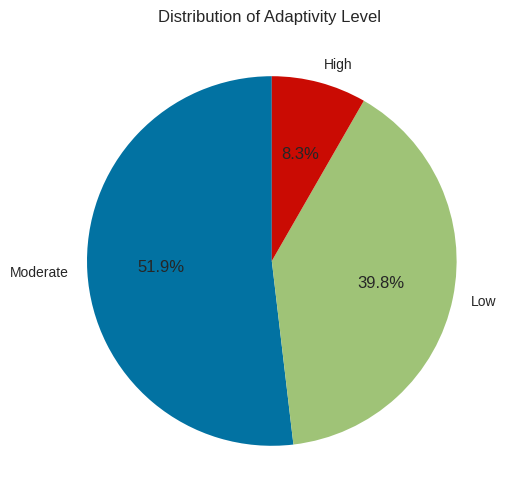

In [84]:
#class lable distribution

counts = data["Adaptivity Level"].value_counts()
counts.plot.pie( autopct='%1.1f%%',figsize=(6,6) ,startangle=90)
plt.title("Distribution of Adaptivity Level ")
plt.ylabel(' ')
plt.show()

# 4-Data preprocessing

## Loading the dataset and Import libraries:

In [85]:
#read Data
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data=pd.read_csv('students_adaptability_level_online_education.csv')
df=pd.DataFrame(data)
df_copy=df.copy()
df.head()



,Gender,Age,Education Level,Institution Type,IT Student,Location,Load-shedding,Financial Condition,Internet Type,Network Type,Class Duration,Self Lms,Device,Adaptivity Level
0,Boy,21-25,University,Non Government,No,Yes,Low,Mid,Wifi,4G,3-6,No,Tab,Moderate
1,Girl,21-25,University,Non Government,No,Yes,High,Mid,Mobile Data,4G,1-3,Yes,Mobile,Moderate
2,Girl,16-20,College,Government,No,Yes,Low,Mid,Wifi,4G,1-3,No,Mobile,Moderate
3,Girl,11-15,School,Non Government,No,Yes,Low,Mid,Mobile Data,4G,1-3,No,Mobile,Moderate
4,Girl,16-20,School,Non Government,No,Yes,Low,Poor,Mobile Data,3G,0,No,Mobile,Low


#Statistical Summries:

In [86]:
#Statistical summries
df.describe()

,Gender,Age,Education Level,Institution Type,IT Student,Location,Load-shedding,Financial Condition,Internet Type,Network Type,Class Duration,Self Lms,Device,Adaptivity Level
count,1205,1205,1205,1205,1205,1205,1205,1205,1205,1205,1205,1205,1205,1205
unique,2,6,3,2,2,2,2,3,2,3,3,2,3,3
top,Boy,21-25,School,Non Government,No,Yes,Low,Mid,Mobile Data,4G,1-3,No,Mobile,Moderate
freq,663,374,530,823,901,935,1004,878,695,775,840,995,1013,625


From the statistical summary, we can see for each attribute how many entries there are (count), how many different categories exist (unique), which value appears the most (top), and how many times it appears (freq). This helps me notice which values are the most common, like the most used device or the most frequent institution type.


Because the data is mostly categorical (not numeric), we can’t apply the five-number summary [which shows the minimum, Q1, median, Q3, and maximum] the way we do with numeric columns.

The dataset contains no missing values in any column (all 1205 rows × 14 attributes are complete). Therefore, no imputation or deletion of missing data is required at this stage.

# Graphs:

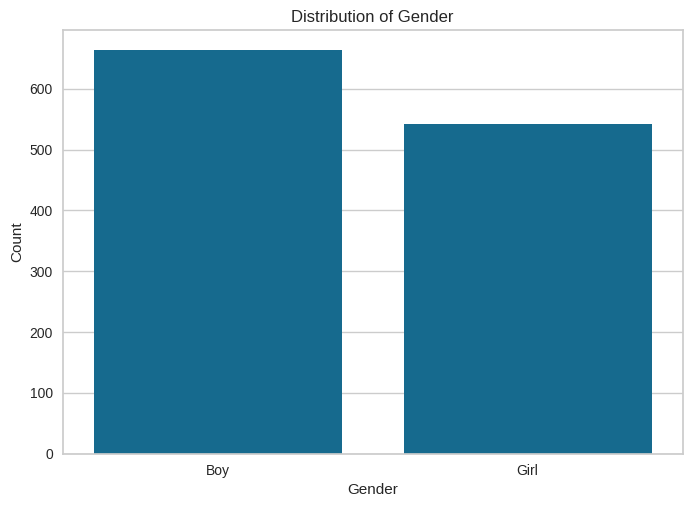

In [87]:
#Bar-plot for Gender attribute
sns.countplot(x='Gender',data=df)
plt.title("Distribution of Gender")
plt.ylabel("Count")
plt.show()

Distribution of Gender: Bar Chart
This bar chart shows that the dataset has more boys (about 55%) than girls (about 45%).. the difference is not very large, but boys are still the majority group.


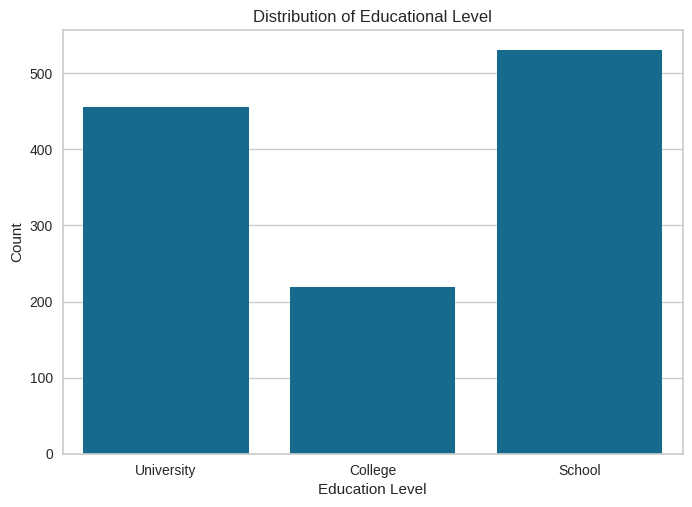

In [88]:
##Bar-plot for  Education Level attribute
sns.countplot(x='Education Level', data=df)
plt.title("Distribution of Educational Level")
plt.ylabel("Count")
plt.show()

Distribution of Educational Level: Bar Chart
This bar chart shows that school students form the largest group (about %44), followed by university students (about 39%).. college students are the smallest group compared to the others (about 17%).


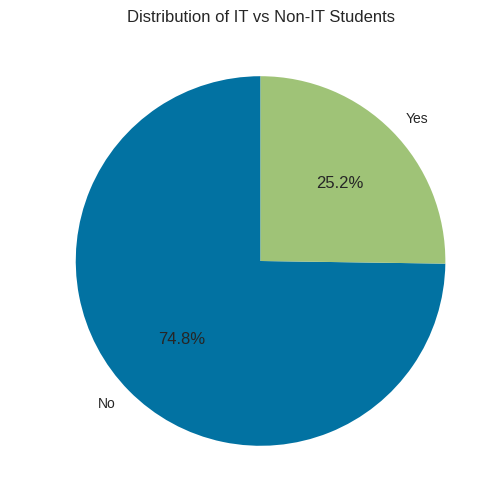

In [89]:
# Count values for IT Student
counts = df["IT Student"].value_counts()

# Pie chart
counts.plot.pie( autopct='%1.1f%%',figsize=(6,6) ,startangle=90)
plt.title("Distribution of IT vs Non-IT Students")
plt.ylabel(' ')
plt.show()

Distribution of IT vs Non-IT Students: Pie Chart





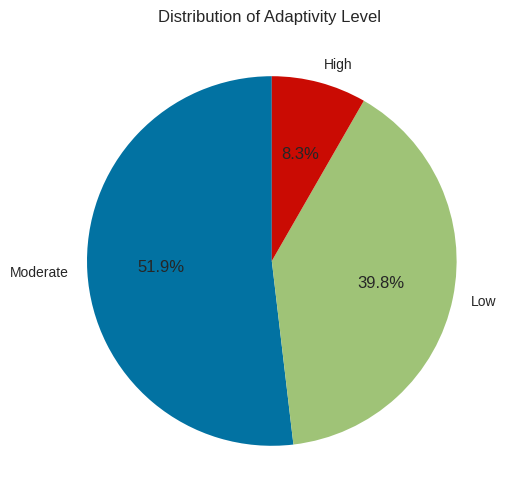

In [90]:
#class lable distribution

counts = df["Adaptivity Level"].value_counts()
counts.plot.pie( autopct='%1.1f%%',figsize=(6,6) ,startangle=90)
plt.title("Distribution of Adaptivity Level ")
plt.ylabel(' ')
plt.show()

Distribution of Adaptivity Level: Pie Chart

It shows that the dataset is not balanced across the three classes.
Moderate represents the majority class with 51.9% of students.
Low adaptability accounts for 39.8%, making it the second-largest group.
High adaptability is the minority class, representing only 8.3% of the dataset.
This distribution indicates a class imbalance, where the “High” class is significantly underrepresented compared to the other two. Such imbalance can influence model performance, causing classifiers to favor the majority classes (Moderate and Low) and struggle to correctly identify the minority class (High).



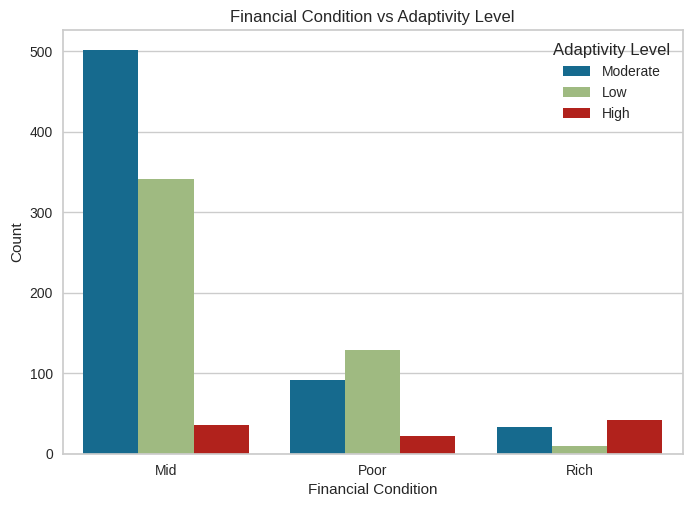

In [91]:
#Grouped bar chart Financial Condition and Adaptivity Level
sns.countplot(x="Financial Condition", hue="Adaptivity Level", data=df)
plt.title("Financial Condition vs Adaptivity Level")
plt.ylabel("Count")
plt.show()


Financial Condition vs Adaptivity Level: Bar Chart
This bar chart shows that most students from middle financial condition are at moderate adaptability (about 55%).. students from poor condition are more likely to have low adaptability (about 60%), while rich students are very few overall (less than 5%).


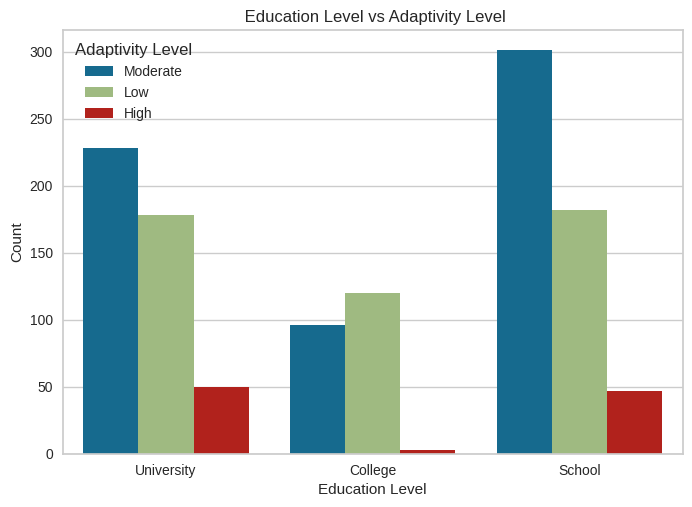

In [92]:
##Grouped bar chart Education Level and Adaptivity Level
sns.countplot(x='Education Level', hue="Adaptivity Level", data=df)
plt.title(" Education Level vs Adaptivity Level")
plt.ylabel("Count")
plt.show()

This grouped bar chart compares Education Level (School, College, University) with Adaptivity Level (Low, Moderate, High).
It shows that most participants across all education levels have a Moderate adaptivity level, while High adaptivity is the least common.

In [93]:
import pandas as pd

# Load raw dataset
df_raw = pd.read_csv("Raw_dataset.csv")


# Data Cleaning:

1- Removing Duplicates:

In [94]:
# Check for duplicate rows
num_duplicates = df_raw.duplicated().sum()
print("Number of duplicate rows:", num_duplicates , "\n")

df_raw = df_raw.drop_duplicates()
print("DataFrame after dropping all duplicate rows:\n")
print(df_raw)
df_raw.to_csv('Cleaned_dataset.csv', index=False)

Number of duplicate rows: 949 

DataFrame after dropping all duplicate rows:

     Gender     Age Education Level Institution Type IT Student Location  \
0       Boy   21-25      University   Non Government         No      Yes   
1      Girl   21-25      University   Non Government         No      Yes   
2      Girl   16-20         College       Government         No      Yes   
3      Girl  15-Nov          School   Non Government         No      Yes   
4      Girl   16-20          School   Non Government         No      Yes   
...     ...     ...             ...              ...        ...      ...   
1124    Boy   21-25      University   Non Government        Yes       No   
1132    Boy   16-20         College       Government         No      Yes   
1149   Girl   16-20         College   Non Government         No       No   
1160    Boy   21-25      University   Non Government        Yes       No   
1197    Boy   21-25      University   Non Government        Yes      Yes   

     Load

We checked for duplicate rows in the dataset and found 949 duplicates.
Duplicate rows usually indicate repeated records of the same student, which can bias the analysis and models.
Therefore, we removed the duplicates to keep only unique entries.
The dataset is now cleaned and contains only distinct records

2-Handling Missing Values:

In [95]:
#Missing values
print("\nTotal number of missing values in the dataset:", df.isna().sum())


Total number of missing values in the dataset: Gender                 0
Age                    0
Education Level        0
Institution Type       0
IT Student             0
Location               0
Load-shedding          0
Financial Condition    0
Internet Type          0
Network Type           0
Class Duration         0
Self Lms               0
Device                 0
Adaptivity Level       0
dtype: int64


The dataset contains no missing values in any column (all 1205 rows × 14 attributes are complete). Therefore, no imputation or deletion of missing data is required at this stage.

#  Data Transformation:

1- Encoding categorical data:

In [96]:
# Data Preprocessing
import pandas as pd
df = pd.read_csv('Cleaned_dataset.csv')
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

# Apply Label Encoding to each column
for col in df.columns:
    if df[col].dtype == 'object':   # Only encode categorical columns
        df[col] = encoder.fit_transform(df[col])

print("\n All categorical attributes have been encoded into numeric form.")


#Display the data after Encode it
print("Dataset after Encoding : ")
print(df)

df.to_csv('Cleaned_dataset.csv', index=False)


 All categorical attributes have been encoded into numeric form.
Dataset after Encoding : 
     Gender  Age  Education Level  Institution Type  IT Student  Location  \
0         0    3                2                 1           0         1   
1         1    3                2                 1           0         1   
2         1    2                0                 0           0         1   
3         1    1                1                 1           0         1   
4         1    2                1                 1           0         1   
..      ...  ...              ...               ...         ...       ...   
251       0    3                2                 1           1         0   
252       0    2                0                 0           0         1   
253       1    2                0                 1           0         0   
254       0    3                2                 1           1         0   
255       0    3                2                 1          

Since most attributes in the dataset are categorical, we applied Label Encoding to convert text-based categories into numerical values. This step is necessary because machine learning model.

2- Normalization:

In [97]:
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('Cleaned_dataset.csv')

scaler = MinMaxScaler()

df['Age'] = scaler.fit_transform(df[['Age']])

df.to_csv('Cleaned_dataset.csv', index=False)
print("Age column after Normalization : ")
print(df)

Age column after Normalization : 
     Gender  Age  Education Level  Institution Type  IT Student  Location  \
0         0  0.6                2                 1           0         1   
1         1  0.6                2                 1           0         1   
2         1  0.4                0                 0           0         1   
3         1  0.2                1                 1           0         1   
4         1  0.4                1                 1           0         1   
..      ...  ...              ...               ...         ...       ...   
251       0  0.6                2                 1           1         0   
252       0  0.4                0                 0           0         1   
253       1  0.4                0                 1           0         0   
254       0  0.6                2                 1           1         0   
255       0  0.6                2                 1           1         1   

     Load-shedding  Financial Condition  

Normalization was applied to ensure Age is scaled to the same range as other variables, improving model performance. we normalize the 'Age' column using Min-Max Scaling method since Age has a fixed and bounded range (1-30), min-max scaling is a good option as it retains the distribution of the data while normalizing to a 0-1 range



3- Discretization:

In [98]:
import pandas as pd

# Read the dataset
df = pd.read_csv('Cleaned_dataset.csv')

# Map textual duration ranges to numeric midpoints
duration_mapping = {
    "0": 0,
    "1-3": 2,
    "3-6": 4.5
}

# Replace the 'Class Duration' column with numeric equivalents
df['Class Duration'] = df['Class Duration'].replace(duration_mapping)

# Define bins for discretization
bins = [0, 1, 3, 6]  # Bins: 0-1 (No class), 1-3 (2 hours), 3-6 (3 hours)
labels = ['0', '1', '2']

# Apply pd.cut() to discretize
df['Class Duration'] = pd.cut(
    df['Class Duration'],
    bins=bins,
    labels=labels,
    include_lowest=True,
    duplicates='drop'
)

# Display the result
print("Class Duration after Discretization:")
print(df['Class Duration'])

# Save the binned dataset
df.to_csv('Cleaned_dataset.csv', index=False)


Class Duration after Discretization:
0      1
1      0
2      0
3      0
4      0
      ..
251    1
252    0
253    0
254    0
255    1
Name: Class Duration, Length: 256, dtype: category
Categories (3, object): ['0' < '1' < '2']


Here in discretization, we convert numbers to Ranking of class duration attribute to:

0: (0=no class)
1-3: (1 =2hours)
3-6: 2 (2= 3hours) we used mapping to convert the data into numeric equivalents based on the original duration range, then we binned it into three categories.

Discretization simplifies continuous duration values into interpretable categories, improving model interpretability.

## Data Integration:

1- chi square:

In [99]:

from scipy.stats import chi2_contingency
df = pd.read_csv('Cleaned_dataset.csv')
# Create a contingency table
contingency_table = pd.crosstab(df['Adaptivity Level'], df['Education Level'])
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected ", expected)


Contingency Table:
Education Level    0   1   2
Adaptivity Level            
0                  1  11  12
1                 28  37  49
2                 24  34  60

Chi-Square Statistic: 6.613178148599465
Degrees of Freedom: 4
Expected  [[ 4.96875    7.6875    11.34375  ]
 [23.6015625 36.515625  53.8828125]
 [24.4296875 37.796875  55.7734375]]





Here we created a contingency table to analyze the relationship between 'Adaptivity Level' and 'Education Level', and then perform a Chi-Square test to determine if there is a significant association between these two categorical variables.



# Five-numbers summary:

In [100]:
#Five-numbers summary
df.describe()

,Gender,Age,Education Level,Institution Type,IT Student,Location,Load-shedding,Financial Condition,Internet Type,Network Type,Class Duration,Self Lms,Device,Adaptivity Level
count,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000
mean,0.421875,0.466406,1.265625,0.593750,0.304688,0.710938,0.789062,0.378906,0.460938,1.601562,0.203125,0.226562,0.855469,1.367188
std,0.494826,0.223616,0.781997,0.492094,0.461177,0.454215,0.408773,0.651532,0.499448,0.543624,0.403113,0.419427,0.413746,0.649236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.400000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000
50%,0.000000,0.400000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000
75%,1.000000,0.600000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,1.000000,2.000000
max,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,2.000000,2.000000


**After the preprocessing steps and encoding all categorical data into numeric form, we became able to compute and display the five-number summary (Minimum, Q1, Median, Q3, Maximum) for the numerical attributes:**


The dataset contains 256 entries, and all variables show complete data with no missing values. Since most of the attributes are encoded numerically (0, 1, or 2), the five-number summary helps describe how these coded categories are distributed.

**Mean:** Across the attributes, the mean values
generally fall between 0 and 1, which reflects that most responses lie in the lower or middle encoded categories. This gives a sense of the “typical” level for each variable after encoding.

**Standard Deviation:** The standard deviation values range from around 0.22 to 0.78, showing that some attributes have very little variation (like Age and binary fields), while others display a wider spread (like Financial Condition and Education Level). Higher std values indicate that responses cover more categories.

**Minimum:**For all attributes, the minimum value is 0, representing the lowest encoded category in each field.

**1st Quartile (25%):** Most of the 25% percentile values also fall at 0 or 1, which means a large portion of the dataset belongs to the lower category group.

**Median (50%): **The median values show that half of the participants fall within the lowest or middle categories. For many binary variables, the median is 0, indicating that the majority of respondents belong to the first category.

**3rd Quartile (75%): **The 75% percentile typically reaches 1 or 2, showing the upper range of encoded responses and illustrating how the dataset spreads toward higher categories.

**Maximum:** Maximum values range between 1 and 2 depending on the variable, representing the highest category available in the encoding.


In summary, the five-number summary highlights that most attributes in the dataset are clustered around the lower and middle encoded categories, with moderate variation across variables. The quartiles and max values show how responses extend toward higher categories, giving a clear picture of both the central tendency and the spread of the encoded data.

## Graphs after Preprocessing:

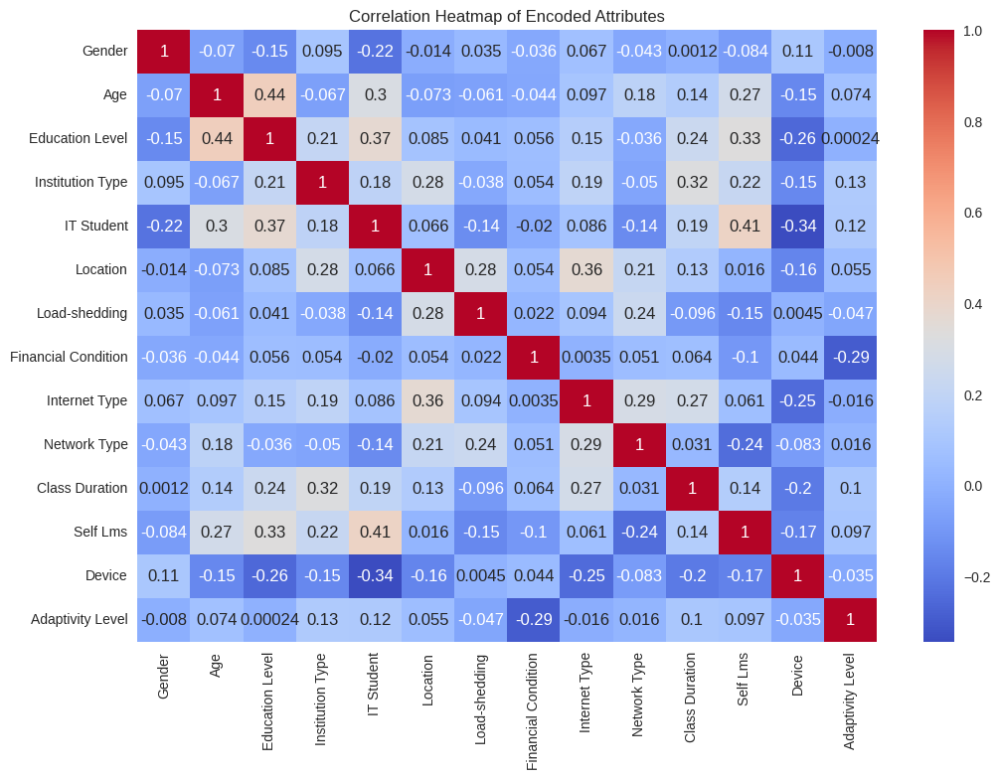

In [101]:

#Heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap of Encoded Attributes")
plt.show()

This heatmap shows the correlation between all encoded attributes after preprocessing. Most correlations are weak, meaning the attributes are fairly independent and provide unique information. A moderate positive correlation appears between Age and Education Level (0.44), showing that older students usually have higher education levels. There’s also a noticeable relationship between IT Student and Self LMS (0.41), suggesting IT students tend to use LMS more. No attributes have a very high correlation (close to 1), indicating there’s no redundancy in the dataset and all features can be kept for further analysis.

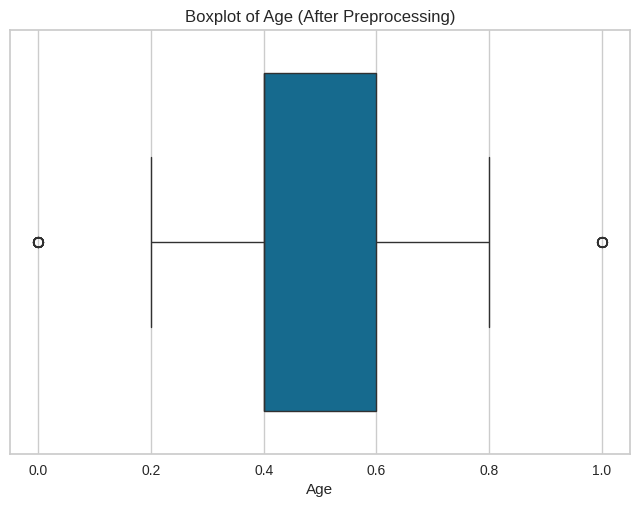

In [102]:
#Age Boxplot
sns.boxplot(x=df["Age"])
plt.title("Boxplot of Age (After Preprocessing)")
plt.xlabel("Age")
plt.show()

This boxplot shows the distribution of the Age attribute after preprocessing. Most students fall within the middle range (around 0.4–0.8), while a few outliers appear at both ends (near 0 and 1), indicating some students are noticeably younger or older than the rest.

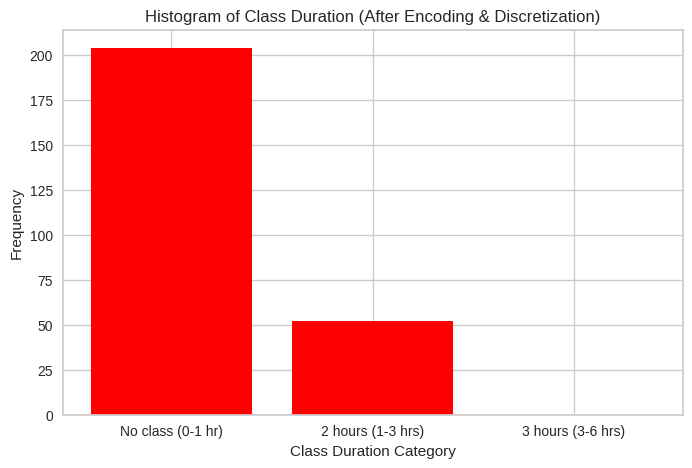

In [103]:
#Histogram of the class duration after encoding and discretization

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

# Plot histogram for discretized class duration
plt.hist(df['Class Duration'],
         bins=[-0.5, 0.5, 1.5, 2.5],
         color='red', rwidth=0.8)

# Set category labels
plt.xticks([0, 1, 2], ['No class (0-1 hr)', '2 hours (1-3 hrs)', '3 hours (3-6 hrs)'])

# Titles and labels
plt.title("Histogram of Class Duration (After Encoding & Discretization)")
plt.xlabel("Class Duration Category")
plt.ylabel("Frequency")

plt.show()

This histogram shows that most students have class durations between 1–3 hours (around 200 students), followed by a smaller group with 0–1 hour (no class) durations. There are no students in the 3–6 hour category.

In [104]:
# Save the final preprocessed dataset
df.to_csv("Cleaned_dataset.csv", index=False)


# Data Before and After Preprocessing:

In [105]:
df_before = pd.read_csv("Raw_dataset.csv")


print("===== DATA BEFORE PROCESSING =====")
print(df_before)


===== DATA BEFORE PROCESSING =====
     Gender     Age Education Level Institution Type IT Student Location  \
0       Boy   21-25      University   Non Government         No      Yes   
1      Girl   21-25      University   Non Government         No      Yes   
2      Girl   16-20         College       Government         No      Yes   
3      Girl  15-Nov          School   Non Government         No      Yes   
4      Girl   16-20          School   Non Government         No      Yes   
...     ...     ...             ...              ...        ...      ...   
1200   Girl   16-20         College   Non Government         No      Yes   
1201   Girl   16-20         College   Non Government         No       No   
1202    Boy  15-Nov          School   Non Government         No      Yes   
1203   Girl   16-20         College   Non Government         No       No   
1204   Girl  15-Nov          School   Non Government         No      Yes   

     Load-shedding Financial Condition Internet Type

**Before Preprocessing:**

The dataset originally contained 1205 rows and 14 columns.
All features were in their raw, original form, including:

Categorical attributes (e.g., Gender, Education Level, Institution Type, Network Type, Device, Adaptivity Level).

Age ranges in textual format (e.g., "16–20", "21–25", "15-Nov").

Mixed text categories across all features.
The data contained:

Non-numeric values that required encoding.
Inconsistent formats such as "15-Nov" inside the Age column.

Multiple categorical variables that needed conversion for modeling.

No scaling or transformation had been applied yet.


In [106]:
df_after = pd.read_csv("Cleaned_dataset.csv")

print("===== DATA AFTER PROCESSING =====")
print(df_after)


===== DATA AFTER PROCESSING =====
     Gender  Age  Education Level  Institution Type  IT Student  Location  \
0         0  0.6                2                 1           0         1   
1         1  0.6                2                 1           0         1   
2         1  0.4                0                 0           0         1   
3         1  0.2                1                 1           0         1   
4         1  0.4                1                 1           0         1   
..      ...  ...              ...               ...         ...       ...   
251       0  0.6                2                 1           1         0   
252       0  0.4                0                 0           0         1   
253       1  0.4                0                 1           0         0   
254       0  0.6                2                 1           1         0   
255       0  0.6                2                 1           1         1   

     Load-shedding  Financial Condition  

**After Preprocessing:**

After preprocessing, the dataset became fully numerical, which is required for machine learning algorithms.

All categorical attributes were encoded into numeric values (e.g., Boy→0, Girl→1).

The Age ranges were successfully converted into numeric scaled values (e.g., 0.2, 0.4, 0.6).

The dataset size changed to 256 rows after removing duplicated entries

Feature scaling/normalization was applied to ensure:
Consistent value ranges
All features contribute equally to the model
The final output shows each column in clean integer or normalized format with no text values remaining.

# 5- Data Mining Technique


This project applies two main data mining techniques: classification and clustering. These techniques were selected because the study aims to:
(1) Predict students’ adaptability level (Low, Moderate, High), and
(2) Identify natural grouping patterns among students based on their attributes.

Both techniques contribute to understanding the key factors that influence adaptability and how students differ in their online learning behavior.

**5.1 Classification Technique**

The classification task focuses on predicting the Adaptivity Level using multiple student attributes such as gender, age, class duration, education level, internet type, device type, and more.

**Why Classification?**

The target variable Adaptivity Level is categorical with three classes (Low, Moderate, High), making classification the appropriate predictive technique.
Classification helps determine which factors most strongly influence adaptability.
It enables building a model capable of predicting adaptability levels for future students.

**How Classification Was Performed (Python Methods)**

Classification was implemented using the Decision Tree Classifier from the sklearn.tree library with two splitting criteria:

Gini Index
DecisionTreeClassifier(criterion="gini")
Entropy (Information Gain)
DecisionTreeClassifier(criterion="entropy")

**Why Decision Trees?**
Decision Trees are highly interpretable and suitable for educational datasets.
They reveal the most influential attributes (for example, Class Duration appearing at the root node).
They perform effectively with categorical data, which is important because most attributes in the dataset are categorical.
They allow visualizing the decision process, making the classification results easy to understand.

**5.2 Clustering Technique**

The clustering task is used to explore the dataset without relying on the class label. Its purpose is to discover natural groups of students who share similar characteristics in their online learning behavior.

**Why Clustering?**

To uncover hidden patterns in how students differ in terms of adaptability-related attributes.
To examine whether the data naturally forms clusters that align with Low, Moderate, or High adaptability levels.
To evaluate different values of K and determine which number of clusters provides the most meaningful structure.

**How Clustering Was Performed (Python Methods)**

Clustering was implemented using K-Means, imported from sklearn.cluster:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=k)
kmeans.fit(df)

**How K Was Selected**

Two evaluation methods were applied:

Elbow Method
Examined the Within-Cluster Sum of Squares (WSS) to determine where the curve begins to flatten.
Silhouette Method
Evaluated the average silhouette score to measure how well-separated and cohesive the clusters were.
Based on both methods, K = 6 was selected because it produced:
The lowest WSS (most compact clusters)
The highest silhouette score (best separation)
The most meaningful and interpretable cluster structure

| Technique                           | Purpose                         | Python Methods Used                                                                |
| ----------------------------------- | ------------------------------- | ---------------------------------------------------------------------------------- |
| **Classification (Decision Trees)** | Predict Adaptivity Level        | `DecisionTreeClassifier`, `train_test_split`, `accuracy_score`, `confusion_matrix` |
| **Clustering (K-Means)**            | Discover natural student groups | `KMeans`, `silhouette_score`, `inertia_`                                           |


In [107]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier #Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

#Load the Dataset
df = pd.read_csv("https://raw.githubusercontent.com/RandDahmash/Mining-project/main/Dataset/Cleaned_dataset.csv")
df.head()



,Gender,Age,Education Level,Institution Type,IT Student,Location,Load-shedding,Financial Condition,Internet Type,Network Type,Class Duration,Self Lms,Device,Adaptivity Level
0,0,0.6,2,1,0,1,1,0,1,2,1,0,2,2
1,1,0.6,2,1,0,1,0,0,0,2,0,1,1,2
2,1,0.4,0,0,0,1,1,0,1,2,0,0,1,2
3,1,0.2,1,1,0,1,1,0,0,2,0,0,1,2
4,1,0.4,1,1,0,1,1,1,0,1,0,0,1,1


# Dropping High Correlated Attributes

Highly correlated features were removed to reduce redundancy.


## Network Type and Internet Type

In [108]:

from scipy.stats import chi2_contingency, chi2




# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Network Type'], df['Internet Type'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Internet Type   0   1
Network Type         
0               5   2
1              65  23
2              68  93

Chi-Square Statistic: 23.795895025910085
Degrees of Freedom: 2
Expected Frequencies:
[[ 3.7734375  3.2265625]
 [47.4375    40.5625   ]
 [86.7890625 74.2109375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 6.804356338046809e-06

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Institution Type and Education Level

In [109]:


from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Institution Type'], df['Education Level'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")

Contingency Table:
Education Level    0   1   2
Institution Type            
0                 36  25  43
1                 17  57  78

Chi-Square Statistic: 21.167253842826387
Degrees of Freedom: 2
Expected Frequencies:
[[21.53125 33.3125  49.15625]
 [31.46875 48.6875  71.84375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 2.532731953221087e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Load-shedding and Location

In [110]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Load-shedding'], df['Location'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Location        0    1
Load-shedding         
0              29   25
1              45  157

Chi-Square Statistic: 18.976652640018976
Degrees of Freedom: 1
Expected Frequencies:
[[ 15.609375  38.390625]
 [ 58.390625 143.609375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 1.3232778170523934e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Self Lms and Age

In [111]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Self Lms'], df['Age'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Age       0.0  0.2  0.4  0.6  0.8  1.0
Self Lms                              
0          13   50   54   59   15    7
1           0    0   12   42    3    1

Chi-Square Statistic: 40.697717420644885
Degrees of Freedom: 5
Expected Frequencies:
[[10.0546875 38.671875  51.046875  78.1171875 13.921875   6.1875   ]
 [ 2.9453125 11.328125  14.953125  22.8828125  4.078125   1.8125   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 5 ): 20.515005652432873
p-value: 1.0798930515069757e-07

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## IT Student and Gender

In [112]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['IT Student'], df['Gender'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Gender       0   1
IT Student        
0           90  88
1           58  20

Chi-Square Statistic: 11.635924025437134
Degrees of Freedom: 1
Expected Frequencies:
[[102.90625  75.09375]
 [ 45.09375  32.90625]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 0.0006469019908907555

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Class Duration and Age

In [113]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Class Duration'], df['Age'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Age             0.0  0.2  0.4  0.6  0.8  1.0
Class Duration                              
0                12   46   57   64   17    8
1                 1    4    9   37    1    0

Chi-Square Statistic: 28.861705994708995
Degrees of Freedom: 5
Expected Frequencies:
[[10.359375 39.84375  52.59375  80.484375 14.34375   6.375   ]
 [ 2.640625 10.15625  13.40625  20.515625  3.65625   1.625   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 5 ): 20.515005652432873
p-value: 2.4681920918121268e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Institution Type and Location

In [114]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Institution Type'], df['Location'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Location           0    1
Institution Type         
0                 46   58
1                 28  124

Chi-Square Statistic: 18.77992277992278
Degrees of Freedom: 1
Expected Frequencies:
[[ 30.0625  73.9375]
 [ 43.9375 108.0625]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 1.4670338406692878e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Education Level and Device

In [115]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Education Level'], df['Device'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Device            0   1  2
Education Level           
0                 2  50  1
1                 4  78  0
2                37  79  5

Chi-Square Statistic: 36.47124647755991
Degrees of Freedom: 4
Expected Frequencies:
[[ 8.90234375 42.85546875  1.2421875 ]
 [13.7734375  66.3046875   1.921875  ]
 [20.32421875 97.83984375  2.8359375 ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 4 ): 18.46682695290317
p-value: 2.3145987563984996e-07

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Internet Type and Class Duration

In [116]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Internet Type'], df['Class Duration'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Class Duration    0   1
Internet Type          
0               124  14
1                80  38

Chi-Square Statistic: 17.78284025663626
Degrees of Freedom: 1
Expected Frequencies:
[[109.96875  28.03125]
 [ 94.03125  23.96875]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 2.4760634480154146e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Load-shedding and Financial Condition

In [117]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Load-shedding'], df['Financial Condition'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Financial Condition    0   1   2
Load-shedding                   
0                     35  19   0
1                    148  30  24

Chi-Square Statistic: 16.04581194895074
Degrees of Freedom: 2
Expected Frequencies:
[[ 38.6015625  10.3359375   5.0625   ]
 [144.3984375  38.6640625  18.9375   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 0.000327865867268045

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Dropping and Load File

In [118]:


# List of columns to DROP (correlated / redundant)
cols_to_drop = [
    "Internet Type",
    "Institution Type",
    "Location",
    "Age",
    "Gender",
    "Device",
    "Self Lms",
    "Financial Condition"
]

# Drop those columns safely
df_reduced = df.drop(columns=[c for c in cols_to_drop if c in df.columns])

# Display new dataset shape and columns
print(" Reduced dataset created successfully!")
print("Shape:", df_reduced.shape)
print("Remaining columns:", list(df_reduced.columns))

# Save the reduced dataset for further use
df_reduced.to_csv("Reduced_dataset.csv", index=False)
print("File saved as: Reduced_dataset.csv")

#keep working with df instead of df_reduced
df=df_reduced.copy()

 Reduced dataset created successfully!
Shape: (256, 6)
Remaining columns: ['Education Level', 'IT Student', 'Load-shedding', 'Network Type', 'Class Duration', 'Adaptivity Level']
File saved as: Reduced_dataset.csv


## Splitting dataset in feature and target variable


In [119]:
#Split dataset in features and target variable
fn=df.keys().tolist()[:-1]
X = df[fn]#Features names
y = df["Adaptivity Level"]#target variable




# 6-Evaluation and Comparison

# **Classification:**






# **1**-Splitting dataset into 70% Training and 30% Testing

In [120]:

# Split dataset into 70% Training and 30% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (179, 5)
Testing set size: (77, 5)


training set is 179 row and testing in 77 row

## Gini index

In [121]:
#Build Decision Tree Model (Gini Index)

# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)


Accuracy: 0.5194805194805194
Confusion Matrix:
[[ 0  3  0]
 [ 3 24  7]
 [ 2 22 16]]


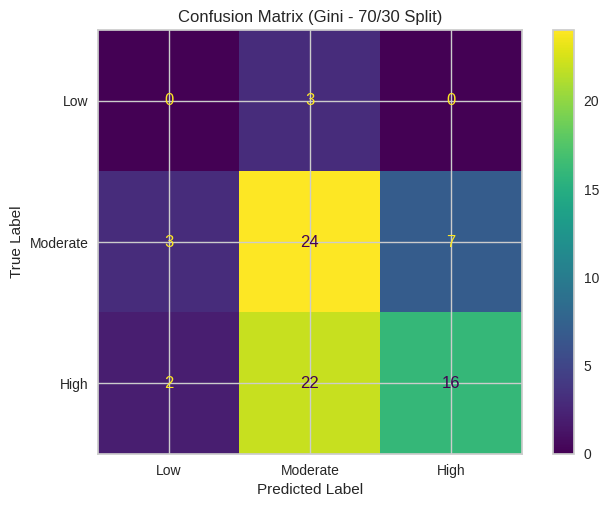

In [122]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gini))

from sklearn.metrics import ConfusionMatrixDisplay

# Replace numbers with real class labels
cn = ["Low", "Moderate", "High"]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(
    dt_gini,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Gini - 70/30 Split)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Accuracy = 51.9%**

The diagonal elements (0, 24, 16) show correctly classified samples for each class (moderate,low, high).

The model performs best for the Low class (label = 1) with 24 correct predictions.

There is significant confusion between class 0 (High) and class 1 (Low), where several “High” adaptivity students are predicted as “Low” (22 misclassified)








In [123]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5694444444444444, 0.9375, 'Class Duration <= 0.5\ngini = 0.597\nsamples = 179\nvalue = [21, 80, 78]\nclass = Moderate'),
 Text(0.3333333333333333, 0.8125, 'IT Student <= 0.5\ngini = 0.584\nsamples = 139\nvalue = [15.0, 70.0, 54.0]\nclass = Moderate'),
 Text(0.45138888888888884, 0.875, 'True  '),
 Text(0.18888888888888888, 0.6875, 'Network Type <= 0.5\ngini = 0.553\nsamples = 105\nvalue = [10, 60, 35]\nclass = Moderate'),
 Text(0.16666666666666666, 0.5625, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0]\nclass = Moderate'),
 Text(0.2111111111111111, 0.5625, 'Education Level <= 0.5\ngini = 0.56\nsamples = 102\nvalue = [10, 57, 35]\nclass = Moderate'),
 Text(0.08888888888888889, 0.4375, 'Network Type <= 1.5\ngini = 0.459\nsamples = 28\nvalue = [0, 18, 10]\nclass = Moderate'),
 Text(0.044444444444444446, 0.3125, 'Load-shedding <= 0.5\ngini = 0.48\nsamples = 10\nvalue = [0, 6, 4]\nclass = Moderate'),
 Text(0.022222222222222223, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclas

The tree starts by splitting on Class Duration because this was the feature that separated the data the best at the beginning. After that, it keeps using IT Student, Network Type, Education Level, and Load-shedding to try to separate the classes.

But none of these features give a strong or clear split, so the tree keeps growing and becomes big and messy. This shows that the data doesn’t have strong patterns, and the model is just trying many small splits to reduce impurity.

## Entropy


In [124]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Accuracy: 0.5194805194805194
Confusion Matrix:
[[ 0  3  0]
 [ 3 24  7]
 [ 2 22 16]]


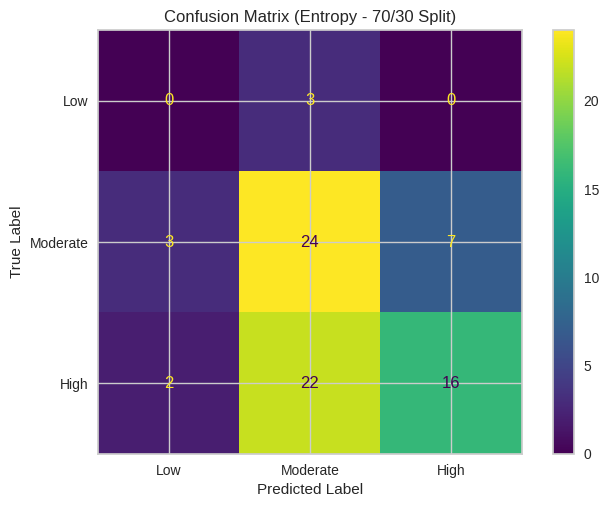

In [125]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_entropy))

from sklearn.metrics import ConfusionMatrixDisplay

cn = ['Low', 'Moderate', 'High']

# Create confusion matrix plot with real labels
disp = ConfusionMatrixDisplay.from_estimator(
    dt_entropy,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Entropy - 70/30 Split)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Accuracy=51.9%**

The diagonal elements (0, 24, 16) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the Low class (label = 1) with 24 correct predictions.

There is noticeable confusion between class 0 (High) and class 1 (Low), where several “High” adaptivity students are predicted as “Low” (22 misclassified)


In [126]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.5353260869565217, 0.9375, 'Class Duration <= 0.5\nentropy = 1.404\nsamples = 179\nvalue = [21, 80, 78]\nclass = Moderate'),
 Text(0.2608695652173913, 0.8125, 'Education Level <= 0.5\nentropy = 1.375\nsamples = 139\nvalue = [15.0, 70.0, 54.0]\nclass = Moderate'),
 Text(0.39809782608695654, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.946\nsamples = 33\nvalue = [0, 21, 12]\nclass = Moderate'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = Moderate'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.954\nsamples = 32\nvalue = [0, 20, 12]\nclass = Moderate'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.94\nsamples = 28\nvalue = [0, 18, 10]\nclass = Moderate'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.971\nsamples = 10\nvalue = [0, 6, 4]\nclass = Moderate'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nv

This entropy-based decision tree uses Class Duration as the first split, meaning it gave the highest information gain in the entire dataset. After that, the tree keeps splitting using IT Student, Network Type, Education Level, and Load-shedding.

The splits are small and inconsistent because none of the features provide a strong pattern. That’s why the tree becomes large, with many branches trying to reduce entropy little by little.

## Comparsion :
Gini Index accuracy=	51.9%

Information Gain (Entropy) accuracy=	51.9%

Both Gini and Entropy gave ≈ 51.9% accuracy, performing best on “Low” adaptivity but confusing “High” with “Low,” showing no major difference between the two criteria.

# 2-Splitting dataset into 80% Training and 20% Testing

In [127]:
# Split dataset into 80% Training and 20% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (204, 5)
Testing set size: (52, 5)


training set is 204 rows and testing is 52 row

## Gini index

In [128]:
#Build Decision Tree Model (Gini Index)
# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)

Accuracy: 0.5384615384615384
Confusion Matrix:
[[ 0  1  1]
 [ 3  8  9]
 [ 2  8 20]]


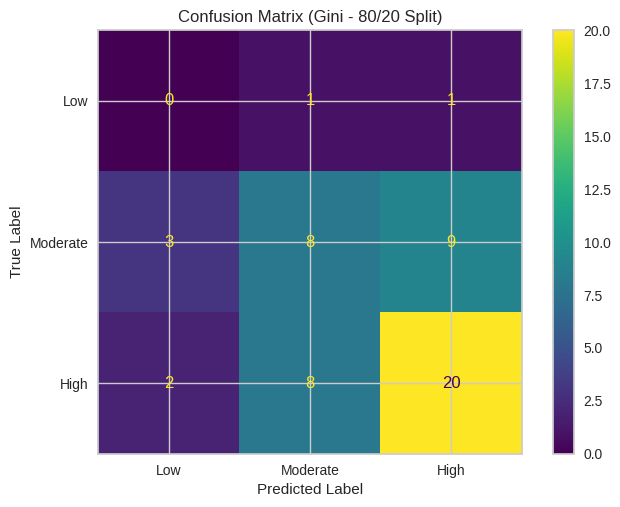

In [129]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gini))

from sklearn.metrics import ConfusionMatrixDisplay


cn = ["Low", "Moderate", "High"]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(
    dt_gini,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Gini - 80/20 Split)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Accuracy= 53.8%**

The diagonal elements (0, 8, 20) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label = 0) with 20 correct predictions, followed by the Low class (label = 1) with 8 correct predictions.
However, it completely fails to classify the Moderate class (label = 2), as none of its samples were predicted correctly.

In [130]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5790816326530612, 0.9375, 'Class Duration <= 0.5\ngini = 0.59\nsamples = 204\nvalue = [22, 94, 88]\nclass = Moderate'),
 Text(0.336734693877551, 0.8125, 'IT Student <= 0.5\ngini = 0.578\nsamples = 161\nvalue = [16.0, 82.0, 63.0]\nclass = Moderate'),
 Text(0.45790816326530615, 0.875, 'True  '),
 Text(0.17346938775510204, 0.6875, 'Network Type <= 0.5\ngini = 0.55\nsamples = 118\nvalue = [11, 68, 39]\nclass = Moderate'),
 Text(0.15306122448979592, 0.5625, 'gini = 0.0\nsamples = 5\nvalue = [0, 5, 0]\nclass = Moderate'),
 Text(0.19387755102040816, 0.5625, 'Education Level <= 0.5\ngini = 0.561\nsamples = 113\nvalue = [11, 63, 39]\nclass = Moderate'),
 Text(0.08163265306122448, 0.4375, 'Network Type <= 1.5\ngini = 0.464\nsamples = 30\nvalue = [0, 19, 11]\nclass = Moderate'),
 Text(0.04081632653061224, 0.3125, 'Load-shedding <= 0.5\ngini = 0.48\nsamples = 10\nvalue = [0, 6, 4]\nclass = Moderate'),
 Text(0.02040816326530612, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclass =

This Gini-based decision tree starts with Class Duration as the first split, meaning this feature provided the strongest separation between the classes in the 80% training data. After that, the tree continues splitting using the same main attributes as before—IT Student, Network Type, Education Level, and Load-shedding.

The structure still looks large and mixed, which shows that the dataset doesn't have clear or strong patterns. The tree needs many small splits to reduce impurity.

## Entropy

In [131]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Accuracy: 0.5384615384615384
Confusion Matrix:
[[ 0  1  1]
 [ 3  8  9]
 [ 2  8 20]]


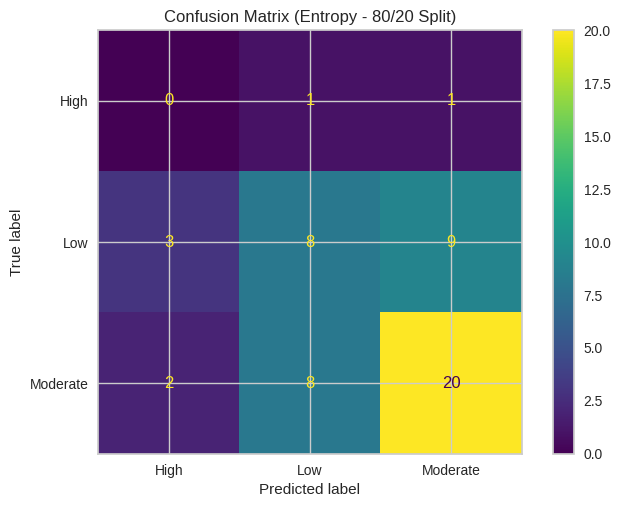

In [132]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_entropy))

# Custom class labels
cn = ["High", "Low", "Moderate"]

from sklearn.metrics import ConfusionMatrixDisplay

# Create a confusion matrix display object with real labels
disp = ConfusionMatrixDisplay.from_estimator(
    dt_entropy,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Entropy - 80/20 Split)")
plt.show()


**Accuracy =53.8%**

The diagonal elements (0, 8, 20) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 20 correct predictions, followed by the Low class (label = 1), with 8 correct predictions.
Similar to the Gini model, it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [133]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.532608695652174, 0.9375, 'Class Duration <= 0.5\nentropy = 1.385\nsamples = 204\nvalue = [22, 94, 88]\nclass = Low'),
 Text(0.2554347826086957, 0.8125, 'Education Level <= 0.5\nentropy = 1.356\nsamples = 161\nvalue = [16.0, 82.0, 63.0]\nclass = Low'),
 Text(0.3940217391304348, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.961\nsamples = 39\nvalue = [0, 24, 15]\nclass = Low'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = Low'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.968\nsamples = 38\nvalue = [0, 23, 15]\nclass = Low'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.948\nsamples = 30\nvalue = [0, 19, 11]\nclass = Low'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.971\nsamples = 10\nvalue = [0, 6, 4]\nclass = Low'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nvalue = [0, 5, 2]\nclass = Low'),
 Te

This entropy tree starts with Class Duration, which means it gave the highest information gain in the training data. After that, the tree keeps splitting using Load-shedding, IT Student, Network Type, and Education Level. These features don't provide strong or clean separation, so the tree keeps growing deeper and makes many small splits to reduce entropy.

## Comparsion

Both the Gini Index and Entropy (Information Gain) models achieved the same accuracy of approximately 53.8%, indicating that the choice of splitting criterion did not significantly affect the model’s performance.

#3-Splitting dataset into 90% Training and 10% Testing

In [134]:
# Split dataset into 90% Training and 10% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (230, 5)
Testing set size: (26, 5)


training set is 230 rows and testing set is 26 rows

## Gini Index

In [135]:
#Build Decision Tree Model (Gini Index)

# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)

Accuracy: 0.46153846153846156
Confusion Matrix:
[[0 0 1]
 [0 5 4]
 [2 7 7]]


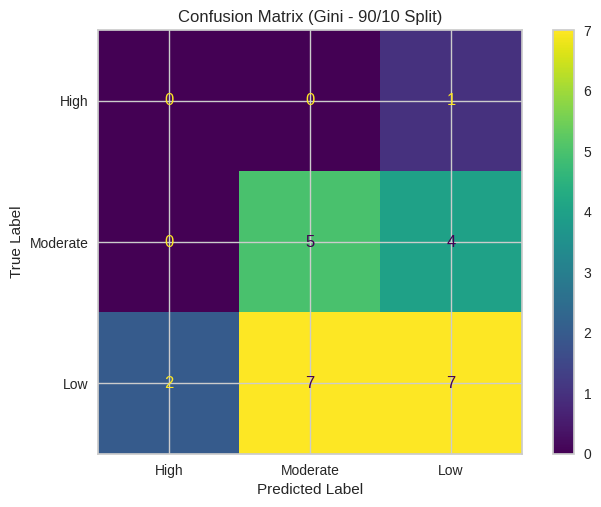

In [136]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gini))

# Real labels for display
cn = ["High", "Moderate", "Low"]

from sklearn.metrics import ConfusionMatrixDisplay

# Create the confusion matrix display
disp = ConfusionMatrixDisplay.from_estimator(
    dt_gini,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Gini - 90/10 Split)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Accuracy =46.1%**

The diagonal elements (0, 5, 7) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 7 correct predictions, followed by the Low class (label = 1), with 5 correct predictions.
 it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [137]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5790816326530612, 0.9375, 'Class Duration <= 0.5\ngini = 0.585\nsamples = 230\nvalue = [23, 105, 102]\nclass = Moderate'),
 Text(0.336734693877551, 0.8125, 'IT Student <= 0.5\ngini = 0.575\nsamples = 183\nvalue = [17, 92, 74]\nclass = Moderate'),
 Text(0.45790816326530615, 0.875, 'True  '),
 Text(0.17346938775510204, 0.6875, 'Network Type <= 0.5\ngini = 0.551\nsamples = 135\nvalue = [12, 77, 46]\nclass = Moderate'),
 Text(0.15306122448979592, 0.5625, 'gini = 0.0\nsamples = 5\nvalue = [0, 5, 0]\nclass = Moderate'),
 Text(0.19387755102040816, 0.5625, 'Education Level <= 0.5\ngini = 0.56\nsamples = 130\nvalue = [12, 72, 46]\nclass = Moderate'),
 Text(0.08163265306122448, 0.4375, 'Network Type <= 1.5\ngini = 0.457\nsamples = 34\nvalue = [0, 22, 12]\nclass = Moderate'),
 Text(0.04081632653061224, 0.3125, 'Load-shedding <= 0.5\ngini = 0.473\nsamples = 13\nvalue = [0, 8, 5]\nclass = Moderate'),
 Text(0.02040816326530612, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclass = M

This Gini-based tree again starts with Class Duration, which means this feature gives the best split and reduces impurity the most at the top level. After that, the model continues splitting using features like IT Student, Network Type, Education Level, and Load-shedding.

The tree grows large because none of the features provides a strong or clean separation between the classes. The model keeps creating many small splits to try to make the groups more pure. This shows that the dataset has weak patterns and no dominant predictor. That’s also why the final accuracy remains low even though the training size changed

## Entropy

In [138]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Accuracy: 0.46153846153846156
Confusion Matrix:
[[0 0 1]
 [0 5 4]
 [2 7 7]]


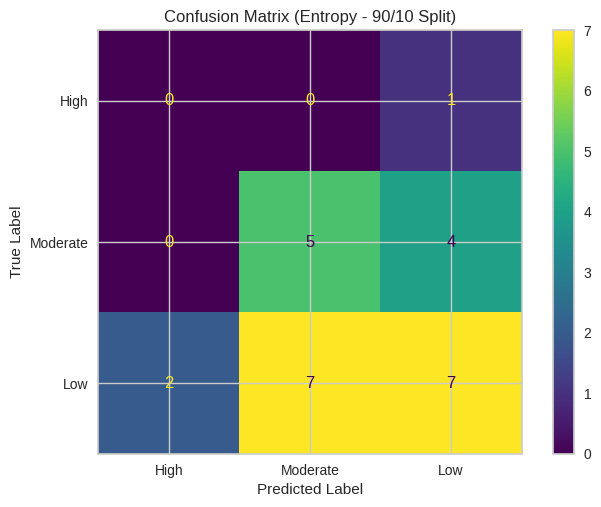

In [139]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_entropy))

# Real labels for display
cn = ["High", "Moderate", "Low"]

from sklearn.metrics import ConfusionMatrixDisplay

# Create the confusion matrix display
disp = ConfusionMatrixDisplay.from_estimator(
    dt_entropy,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Entropy - 90/10 Split)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Accuracy =46.1%**

The diagonal elements (0, 5, 7) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 7 correct predictions, followed by the Low class (label = 1), with 5 correct predictions.
 it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [140]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.532608695652174, 0.9375, 'Class Duration <= 0.5\nentropy = 1.369\nsamples = 230\nvalue = [23, 105, 102]\nclass = Moderate'),
 Text(0.2554347826086957, 0.8125, 'Education Level <= 0.5\nentropy = 1.345\nsamples = 183\nvalue = [17, 92, 74]\nclass = Moderate'),
 Text(0.3940217391304348, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.952\nsamples = 43\nvalue = [0, 27, 16]\nclass = Moderate'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = Moderate'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.959\nsamples = 42\nvalue = [0, 26, 16]\nclass = Moderate'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.937\nsamples = 34\nvalue = [0, 22, 12]\nclass = Moderate'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.961\nsamples = 13\nvalue = [0, 8, 5]\nclass = Moderate'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nvalue 

This entropy-based tree starts with Class Duration, meaning this feature provided the highest information gain at the root. After that, the tree continues splitting using Education Level, Network Type, IT Student, and Load-shedding. These features don’t strongly separate the classes, so the tree ends up with many small and weak splits.

The tree becomes large and mixed because the dataset does not contain strong patterns. Most of the leaves still have a mix of classes, which shows that each split only reduces entropy a little.

# Classification Results:

The two classification algorithms were applied: Decision Tree using Gini Index and Decision Tree using Information Gain (Entropy).

 Both algorithms were tested using three different train–test partitions:
 70/30, 80/20, and 90/10.

Across all partitions, both algorithms produced identical results, meaning the choice of splitting criterion (Gini or Entropy) did not affect the model’s performance for this dataset. This indicates that both criteria generated the same tree structure and selected the same decision boundaries.

**Performance Based on Accuracy**

The 70/30 split achieved an accuracy of 51.9%.

The 80/20 split performed best with an accuracy of 53.8%.

The 90/10 split achieved an accuracy of 46.1%.

The results show that 80/20 partitioning yields the highest accuracy, meaning the model performs slightly better when trained on 80% of the data and tested on 20%.

Confusion Matrices for Each Algorithm and Partition
For each partition (70/30, 80/20, 90/10), the confusion matrices for both Gini and Entropy were identical. This confirms that:

Both models classify the same instances correctly and incorrectly.
Both models follow the same decision-making logic.

**The Algorithm that Performs Best per Partition**

Since Gini and Entropy produce identical accuracy and identical confusion matrices, neither algorithm outperforms the other in any of the three splits.

**The Algorithm that Performs Best Overall**

Because the results match exactly, both algorithms perform equally well overall.
There is no difference in performance or predictive ability between Gini and Entropy on this dataset.

**What the Results Mean**
The classification performance is moderate, with accuracy around 46–53%.
The dataset’s class imbalance and overlapping characteristics limit the model’s performance.
The highest accuracy (53.8%) suggests that the 80/20 split provides the best training/testing balance.

Overall, classification reveals useful patterns but shows that adaptability levels are challenging to predict with high accuracy due to the nature of the dataset.

## Accuracy Table for Both IG and Gini index:

|         | 90% training, 10% testing | 80% training, 20% testing | 70% training, 30% testing |
| --------------- | ------------------------- | ------------------------- | ------------------------- |
| **Accuracy**    |   0.4615                    |    0.5385                    |   0.5195                    |


# **Clustering**

## K-means Clustering

Load librarys & Prepare Features

In [141]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import SilhouetteVisualizer

# Load the preprocessed dataset
df = pd.read_csv("/content/Reduced_dataset.csv")

# Remove target column (Adaptivity Level) - clustering is unsupervised
X = df.drop(['Adaptivity Level'], axis=1)

# Scale the data
X_scaled = X

# 1-Silhouette method:

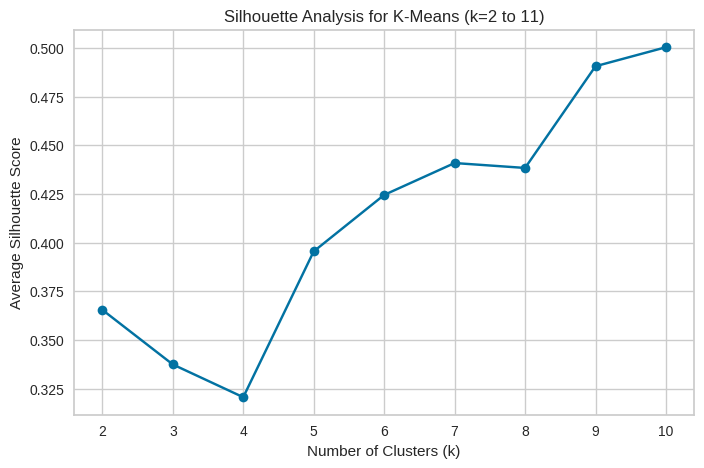

The highest silhouette score is 0.5004 at k = 10
The second highest silhouette score is 0.4906 at k = 9


In [154]:
k_values = range(2, 11)
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    silhouette_scores.append(score)

# Find best and second-best K
best_k = k_values[np.argmax(silhouette_scores)]
sorted_scores = sorted(silhouette_scores, reverse=True)
second_best_score = sorted_scores[1]
second_best_k = k_values[silhouette_scores.index(second_best_score)]

# Plot Silhouette scores
plt.figure(figsize=(8,5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title("Silhouette Analysis for K-Means (k=2 to 11)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Average Silhouette Score")
plt.grid(True)
plt.show()

print(f"The highest silhouette score is {max(silhouette_scores):.4f} at k = {best_k}")
print(f"The second highest silhouette score is {second_best_score:.4f} at k = {second_best_k}")

# 2-Elbow Method:

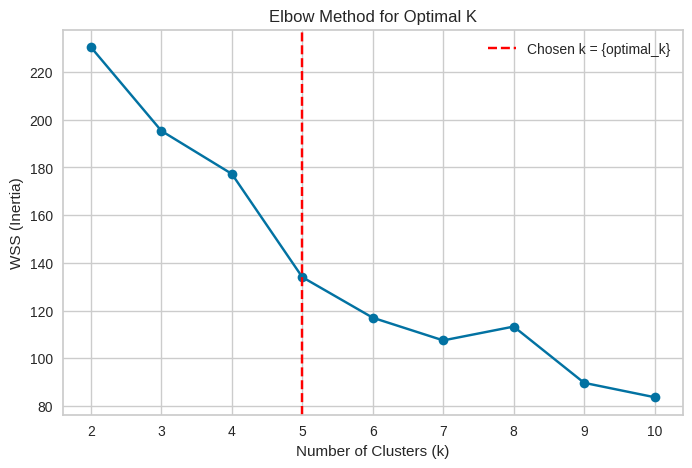

In [155]:
!pip install kneed
from kneed import KneeLocator

wss = []
k_values = range(2, 11)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_scaled)
    wss.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(k_values, wss, marker='o')
plt.title("Elbow Method for Optimal K")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("WSS (Inertia)")
plt.grid(True)

# Use KneeLocator to find the optimal k (elbow point)
knee = KneeLocator(k_values, wss, curve='convex', direction='decreasing')
optimal_k = knee.elbow
# Draw a vertical line at the elbow
plt.axvline(x=optimal_k, linestyle='--', color='red', label='Chosen k = {optimal_k}')
plt.legend()
plt.show()

From the Elbow plot, the curve starts to level off at **K = 5**..  
This means that adding more clusters after 5 doesn’t make a big improvement.  
So, **K = 5** is chosen as the best number of clusters for this dataset.

## **K = 4**

In [156]:
# K-means with K = 4
np.random.seed(42)

# Perform K-means clustering for K=4
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[1.53424658 0.45205479 0.67123288 0.90410959 0.1369863 ]
 [0.47474747 0.09090909 0.78787879 1.83838384 0.12121212]
 [1.91666667 1.         0.88888889 1.83333333 0.44444444]
 [2.         0.         0.89583333 2.         0.29166667]]

Cluster Labels:
[3 3 1 1 0 0 1 1 1 0 3 1 0 1 0 1 2 3 1 1 1 1 1 0 1 1 1 2 0 1 2 1 2 1 0 3 0
 3 2 2 2 1 0 2 1 3 0 0 0 3 1 1 2 3 0 1 1 1 0 0 1 1 0 1 1 3 3 2 2 0 2 0 2 1
 1 1 1 0 0 0 1 2 2 1 0 1 1 2 3 2 0 0 1 2 3 0 1 0 3 0 3 0 1 1 1 2 0 2 0 0 3
 0 1 1 0 3 1 0 1 1 3 2 1 0 1 1 1 0 1 3 1 2 0 3 0 2 1 1 0 1 2 2 3 3 3 0 2 2
 3 1 1 3 1 3 1 3 3 1 1 0 0 3 3 0 1 1 0 3 3 1 2 0 1 1 1 1 1 0 1 3 1 0 1 0 2
 3 2 1 0 1 3 1 1 1 2 1 3 0 0 0 0 3 1 3 3 1 1 3 1 0 0 3 1 1 0 0 1 0 3 3 0 2
 3 0 0 1 2 3 2 0 0 1 1 1 3 0 2 1 3 0 0 1 1 1 3 0 0 0 1 1 0 0 1 1 0 2]


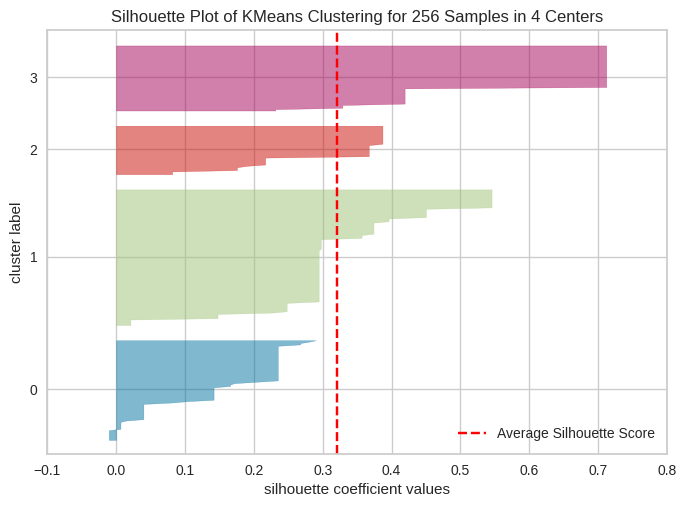

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 256 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [157]:
kmeans = KMeans(n_clusters=4, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()

In [158]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")

WSS: 177.27908364466612
Average Silhouette Score: 0.3205993154053187


## *K = 4 Analyisis*

For K = 4, the WSS of 177.28 shows that the clusters are fairly compact. The Silhouette Score of 0.321 is moderate, meaning the groups are formed reasonably well with some separation between them, but there is still slight overlap. Overall, K = 4 produces stable clusters with a decent structure, even though it is not perfect.

# K = 5

In [159]:
np.random.seed(42)

# Perform K-means clustering for K=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[0.65306122 0.04081633 0.7755102  0.91836735 0.02040816]
 [0.56626506 0.10843373 0.8313253  2.         0.13253012]
 [1.9        1.         0.86666667 2.         0.33333333]
 [2.         0.         0.90740741 1.88888889 0.25925926]
 [2.         0.925      0.5        0.925      0.4       ]]

Cluster Labels:
[3 3 1 1 0 0 1 1 1 0 3 1 0 1 0 1 2 3 1 1 1 1 0 0 1 1 1 2 0 1 2 1 4 1 0 3 0
 3 2 4 2 1 4 2 1 3 4 0 0 3 1 0 2 3 0 1 0 1 0 0 1 1 0 1 1 3 3 2 4 4 2 0 2 1
 0 1 1 3 0 4 1 2 2 0 4 1 1 2 3 2 4 4 1 2 3 0 0 3 3 4 3 4 1 1 1 2 4 2 4 4 3
 0 1 1 4 3 1 0 1 1 3 2 1 4 1 0 1 4 1 3 1 2 4 3 4 2 1 1 4 1 2 4 3 3 3 0 2 2
 3 1 1 3 1 3 1 3 3 1 1 0 0 3 3 4 1 0 4 3 3 1 4 4 1 1 1 0 0 4 1 3 0 4 1 4 2
 3 2 0 3 1 3 1 1 1 2 1 3 0 4 0 3 3 1 3 3 1 1 3 0 4 0 3 1 1 4 4 1 4 3 3 0 2
 3 3 0 1 4 3 2 4 4 1 1 0 3 3 2 1 3 0 0 1 1 1 3 0 0 0 1 1 4 4 0 0 4 2]


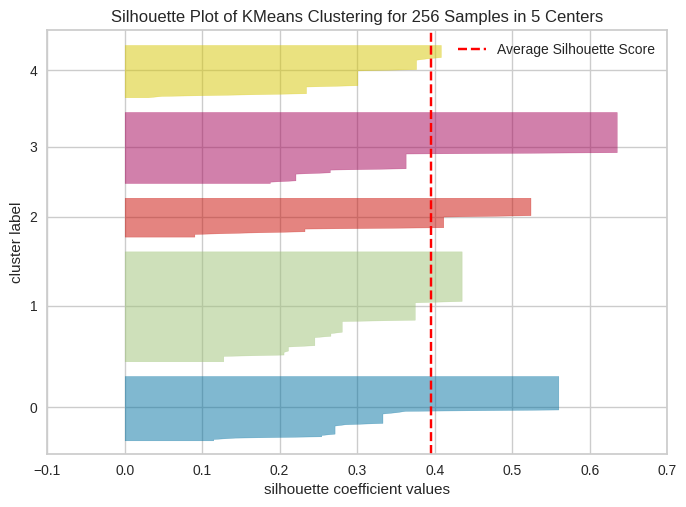

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 256 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [160]:
# Silhouette Plot for K=5
kmeans = KMeans(n_clusters=5, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()

In [161]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")

WSS: 134.0185171525103
Average Silhouette Score: 0.39550425752444796


## Analysis of K = 5


For K = 5, the WSS decreases to 134.02, meaning the clusters become tighter. The Silhouette Score also rises to 0.3955, This improvement means that the clusters are better separated and data points fit more naturally into their assigned groups. Compared to K = 4, K = 5 produces tighter clusters with clearer boundaries and less overlap, making the overall clustering structure stronger and more meaningful. This makes K = 5 a clear improvement over K = 4 in both compactness and separation.

# k = 6

In [162]:
np.random.seed(42)

# Perform K-means clustering for K=6
kmeans = KMeans(n_clusters=6, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[0.76190476 0.04761905 0.9047619  0.9047619  0.02380952]
 [0.19047619 0.         0.         1.66666667 0.14285714]
 [2.         1.         0.85185185 2.         0.37037037]
 [2.         0.         0.90740741 1.88888889 0.25925926]
 [2.         0.925      0.5        0.925      0.4       ]
 [0.63888889 0.16666667 1.         2.         0.11111111]]

Cluster Labels:
[3 3 5 5 0 0 5 5 5 0 3 5 0 5 0 1 2 3 1 1 5 5 0 0 5 5 5 2 0 5 2 5 4 5 0 3 0
 3 2 4 2 5 4 2 5 3 4 0 0 3 5 0 5 3 0 5 1 5 0 0 1 5 0 5 1 3 3 2 4 4 2 0 2 5
 1 5 5 3 0 4 5 2 2 1 4 1 5 2 3 2 4 4 5 2 3 0 0 3 3 4 3 4 5 5 5 2 4 2 4 4 3
 0 1 5 4 3 5 0 5 5 3 5 5 4 5 1 5 4 5 3 5 2 4 3 4 2 5 1 4 1 2 4 3 3 3 0 2 2
 3 5 5 3 5 3 1 3 3 5 5 0 0 3 3 4 5 1 4 3 3 5 4 4 5 5 5 0 0 4 5 3 0 4 5 4 2
 3 2 1 3 1 3 5 5 5 2 5 3 0 4 0 3 3 5 3 3 1 5 3 0 4 0 3 5 5 4 4 5 4 3 3 0 5
 3 3 0 5 4 3 2 4 4 5 5 1 3 3 2 5 3 0 0 5 5 5 3 0 0 0 1 1 4 4 0 0 4 2]


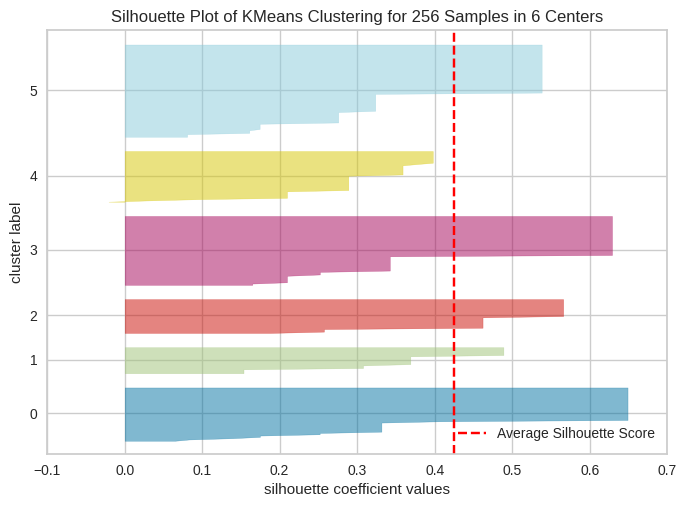

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 256 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [163]:
# Silhouette Plot for K=6
kmeans = KMeans(n_clusters=6, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()

In [164]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=6
kmeans = KMeans(n_clusters=6, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")

WSS: 117.03095238095239
Average Silhouette Score: 0.4245123219685245


## Analysis of K = 6

For K = 6, the WSS improves further to 117.03, giving the most compact clusters among all tested values. At the same time, the Silhouette Score increases to 0.4245, which is higher than both K = 4 and K = 5. This indicates that the clusters are not only tighter but also better separated, with less overlap between groups. In comparison, K = 6 provides clearer and more distinct cluster structure than K = 4 and K = 5, making it the strongest overall configuration.

## comparing the results

K = 4

K=4 produces reasonably compact clusters with a WSS of 177.28, meaning the points inside each cluster are relatively close together. The Silhouette Score of 0.3206 is moderate, indicating fair separation between clusters, although some overlap still exists. Overall, K=4 provides a meaningful structure, but the separation between groups is not very strong.

⸻

K = 5

For K=5, the WSS decreases further to 134.01, which shows stronger compactness than K=4. More importantly, the Silhouette Score increases to 0.3955, meaning the clusters become more well-separated and have less overlap. Compared to K=4, this configuration provides clearer boundaries, better-defined groups, and generally higher-quality clustering. K=5 creates tighter clusters while also improving separation at the same time.

⸻

K = 6

For K=6, the WSS drops again to 117.03, producing the tightest clusters among all tested values. The Silhouette Score of 0.4245 is the highest, showing the strongest separation and the least amount of overlap between clusters. This means K=6 improves both compactness and separation beyond what K=4 and K=5 offer. Overall, K=6 produces the clearest, most distinct, and most meaningful clustering structure in this dataset.

| **Metric**     | **k = 4** | **k = 5** | **k = 6** |
| -------------- | --------- | --------- | --------- |
| **WSS**        | 177.2791  | 134.0185  | 117.0309  |
| **Silhouette** | 0.3206    | 0.3955    | 0.4245    |


## Final dicision:

Based on both WSS and Silhouette performance, K = 6 is selected as the best number of clusters. While compactness improves steadily from K=4 to K=6, the largest improvement in separation occurs at K=6, giving the most distinct clustering structure with minimal overlap. Therefore, K = 6 is the optimal choice for this dataset.

# 7-Findings and Discussion:

**Preprocessing Findings:**

The preprocessing phase ensured the dataset was clean and ready for mining. Missing values were checked, and all attributes were properly encoded into numerical form. Normalization was applied to the Age column using Min–Max scaling, and Class Duration was discretized into meaningful categories. Highly correlated features were removed to avoid redundancy and reduce noise before classification. These steps improved data quality, reduced potential bias, and ensured that the algorithms received consistent, well-structured input.

**Classification Findings:**

Decision Tree classifiers using both Gini Index and Entropy were trained under three different partitions: 70/30, 80/20, and 90/10. Across all splits, both algorithms produced identical performance, showing that the splitting criterion did not influence the model on this dataset.

Accuracy results showed that:

The 80/20 split achieved the highest accuracy (≈53.8%),
Followed by 70/30 (≈51.9%),
Then 90/10 (≈46.1%).

Although the overall accuracy is moderate, the results indicate that student adaptability is challenging to classify due to overlapping patterns among the classes and imbalance in the target label distribution. The Decision Tree revealed which attributes were most influential in determining adaptability level, such as Class Duration, Internet Type, and Education Level, aligning with findings in the research literature that engagement patterns and access conditions strongly influence online learning adaptability.

**Clustering Findings:**

K-means clustering was applied for K = 4, 5, and 6, and each option was evaluated using WSS and Silhouette Score.

The results revealed:

K = 4 produced moderate cohesion and separation.
K = 5 improved compactness and separation.
K = 6 showed the lowest WSS (117.03) and the highest Silhouette Score (0.4245),

indicating:

The most compact clusters

The best separation

The most meaningful clustering structure

Thus, K = 6 was selected as the best clustering solution. Visualizing the clusters further highlighted natural groupings among students in terms of education level, technology access, and class duration.

Overall Interpretation

Both data mining techniques generated meaningful insights.
Classification helped identify key factors influencing student adaptability, though accuracy remained moderate due to class imbalance and overlap.
Clustering successfully discovered natural patterns in the data, with K = 6 producing the most interpretable and cohesive structure.
These findings align with research (Martin et al., 2021) showing that adaptability depends on multiple interconnected factors, making it difficult to classify perfectly but easier to group based on shared characteristics.
Together, the techniques provide valuable insight into how students differ in their readiness for online learning and which variables most strongly influence adaptability.

# 8-References:

Suzan, M. M. H. (2021). Students’ Adaptability Level in Online Education [Data set]. Kaggle.
https://www.kaggle.com/datasets/mdmahmudulhasansuzan/students-adaptability-level-in-online-education


 A. J. Martin, R. J. Collie, and R. P. Nagy, “Adaptability and High School Students’ Online Learning During COVID-19: A Job Demands–Resources Perspective,” Frontiers in Psychology, vol. 12, 2021.
Available: https://www.frontiersin.org/articles/10.3389/fpsyg.2021.702163/full


M. Wang and S. Liu, “Machine Learning-Based Research on the Adaptability of Adolescents to Online Education,” arXiv preprint, 2024.
Available: https://arxiv.org/abs/2408.16849


